In [ ]:
# @ Auther: Hrushikesh Pradhan

In [1]:
#Importing relevant packages for the analysis.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [2]:
path = ('/home/hrushikesh/Downloads/Salary_Dataset_with_Extra_Features.csv.zip')
df = pd.read_csv(path)

In [3]:
pwd

'/home/hrushikesh/Downloads/pr'

In [4]:
df.shape

(22770, 8)

In [5]:
df.head()

,Rating,Company Name,Job Title,Salary,Salaries Reported,Location,Employment Status,Job Roles
0,3.8,Sasken,Android Developer,400000,3,Bangalore,Full Time,Android
1,4.5,Advanced Millennium Technologies,Android Developer,400000,3,Bangalore,Full Time,Android
2,4.0,Unacademy,Android Developer,1000000,3,Bangalore,Full Time,Android
3,3.8,SnapBizz Cloudtech,Android Developer,300000,3,Bangalore,Full Time,Android
4,4.4,Appoids Tech Solutions,Android Developer,600000,3,Bangalore,Full Time,Android


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22770 entries, 0 to 22769
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Rating             22770 non-null  float64
 1   Company Name       22770 non-null  object 
 2   Job Title          22770 non-null  object 
 3   Salary             22770 non-null  int64  
 4   Salaries Reported  22770 non-null  int64  
 5   Location           22770 non-null  object 
 6   Employment Status  22770 non-null  object 
 7   Job Roles          22770 non-null  object 
dtypes: float64(1), int64(2), object(5)
memory usage: 1.4+ MB


In [7]:
df.isna().sum()

Rating               0
Company Name         0
Job Title            0
Salary               0
Salaries Reported    0
Location             0
Employment Status    0
Job Roles            0
dtype: int64

In [8]:
# Describe
df.describe()

,Rating,Salary,Salaries Reported
count,22770.000000,2.277000e+04,22770.000000
mean,3.918213,6.953872e+05,1.855775
std,0.519675,8.843990e+05,6.823668
min,1.000000,2.112000e+03,1.000000
25%,3.700000,3.000000e+05,1.000000
50%,3.900000,5.000000e+05,1.000000
75%,4.200000,9.000000e+05,1.000000
max,5.000000,9.000000e+07,361.000000


# From the descriptives, we can see that there is a huge difference between mean salary and maximum salary. Therefore, I will mark that maximum salary data point as outlier.

In [9]:
for column_name in df.columns:
    unique_values = len(df[column_name].unique())
    print(" Dataset has '{unique_values}' unique '{column_name}'".format(column_name = column_name,unique_values=unique_values))

 Dataset has '41' unique 'Rating'
 Dataset has '11261' unique 'Company Name'
 Dataset has '1080' unique 'Job Title'
 Dataset has '316' unique 'Salary'
 Dataset has '82' unique 'Salaries Reported'
 Dataset has '10' unique 'Location'
 Dataset has '4' unique 'Employment Status'
 Dataset has '11' unique 'Job Roles'


2. Exploratory Data Analysis.
2..Visualizing insights of Features

Which company pays the most salary?

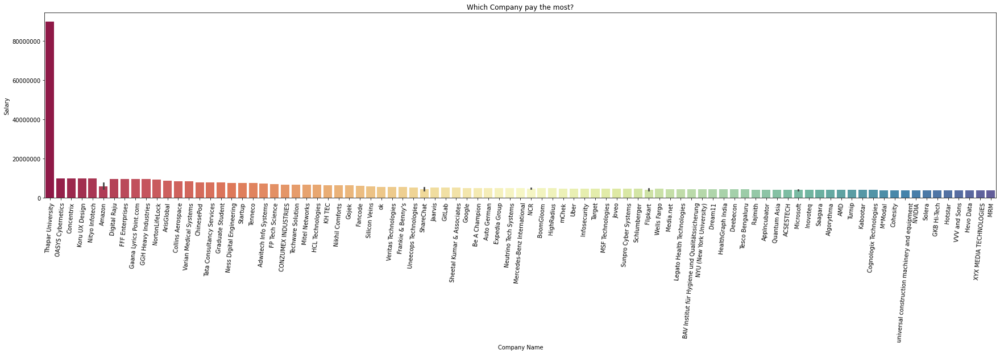

In [10]:
plt.figure(figsize = (30, 6))
plt.xticks(rotation = 85)
plt.ticklabel_format(style = 'plain')
df.sort_values("Salary", axis = 0, ascending = False, inplace = True)
sns.barplot(x = df["Company Name"][0:100], y = df["Salary"][0:100], palette = "Spectral").set(title='Which Company pay the most?');

<AxesSubplot:xlabel='Rating', ylabel='Density'>

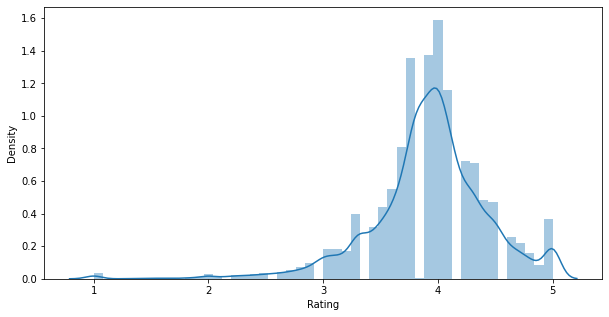

In [11]:
# checking distribution of rating feature
plt.figure(figsize=(10,5))
sns.distplot(df['Rating'])

<AxesSubplot:xlabel='Job Roles', ylabel='count'>

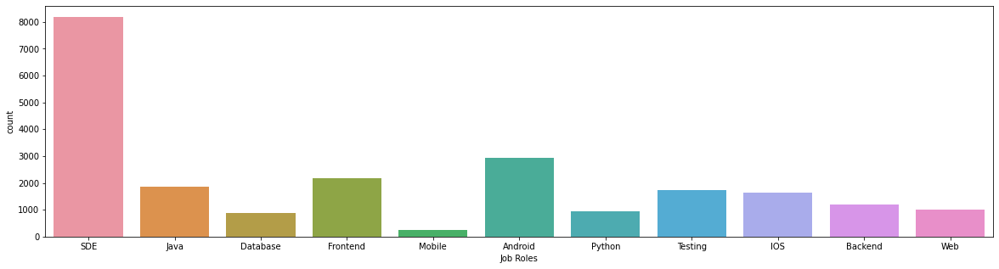

In [12]:
plt.figure(figsize=(20,5))
sns.countplot(df['Job Roles'])

<AxesSubplot:xlabel='Job Roles', ylabel='count'>

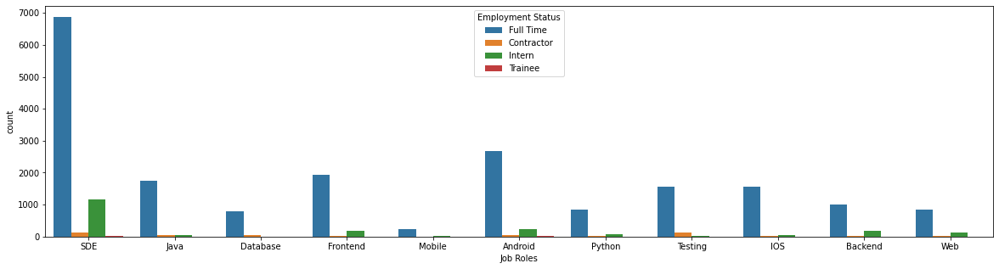

In [13]:
plt.figure(figsize=(20,5))
sns.countplot(df['Job Roles'],hue=df['Employment Status'])

<AxesSubplot:xlabel='Salary', ylabel='Density'>

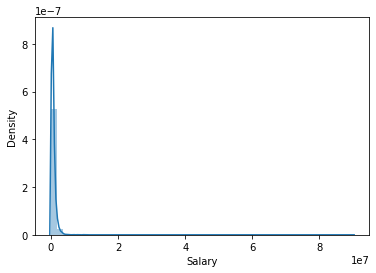

In [14]:
sns.distplot(df['Salary'])

<AxesSubplot:xlabel='Employment Status', ylabel='count'>

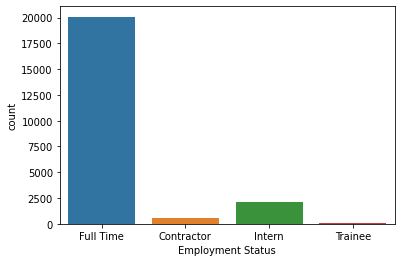

In [15]:
sns.countplot(df['Employment Status'])

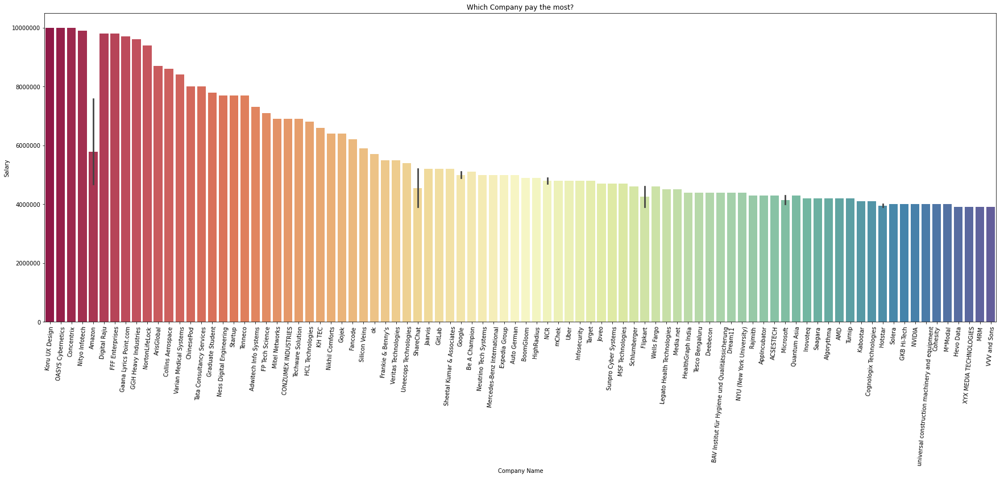

In [16]:
plt.figure(figsize = (30, 10))
plt.xticks(rotation = 85)
plt.ticklabel_format(style = 'plain')
df.sort_values("Salary", axis = 0, ascending = False, inplace = True)
sns.barplot(x = df["Company Name"][1:100], y = df["Salary"][1:100], palette = "Spectral").set(title='Which Company pay the most?');

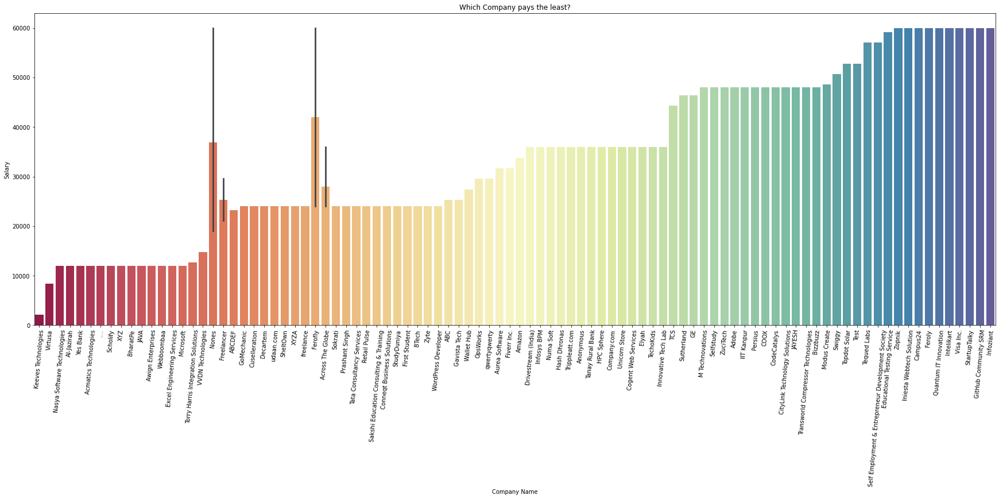

In [17]:
plt.figure(figsize = (30, 10))
plt.xticks(rotation = 85)
plt.ticklabel_format(style = 'plain')
df.sort_values("Salary", axis = 0, ascending = True, inplace = True)
sns.barplot(x = df["Company Name"][0:100], y = df["Salary"][0:100], palette = "Spectral").set(title='Which Company pays the least?');

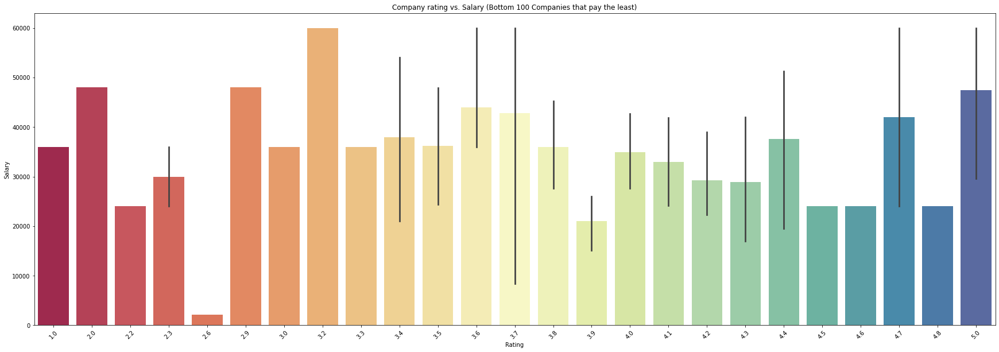

In [18]:
plt.figure(figsize = (30,10))
plt.xticks(rotation = 45)
plt.ticklabel_format(style = 'Plain')
df.sort_values("Salary", axis = 0, ascending = True, inplace = True)
sns.barplot(x = df["Rating"][0:100], y = df["Salary"][0:100], palette = "Spectral").set(title='Company rating vs. Salary (Bottom 100 Companies that pay the least)');

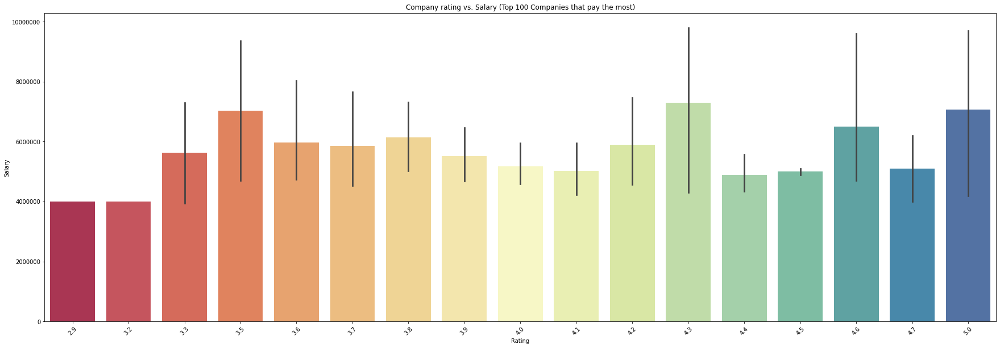

In [19]:
plt.figure(figsize = (30,10))
plt.xticks(rotation = 45)
plt.ticklabel_format(style = 'Plain')
df.sort_values("Salary", axis = 0, ascending = False, inplace = True)
sns.barplot(x = df["Rating"][1:100], y = df["Salary"][1:100] ,orient="v", palette = "Spectral").set(title='Company rating vs. Salary (Top 100 Companies that pay the most)');

In [20]:
column_1 = df["Salary"]
column_2 = df["Rating"]
correlation = column_1.corr(column_2)
print(correlation)

0.025476260428498834




As, we can see that there is not much difference in the ratings of company that pay the highest or lowest salary. So my hypothesis was wrong. Moreover, we can see that there is no correlation between the ratings of company and the salary paid by them.


Does Location have any affect on Salary?

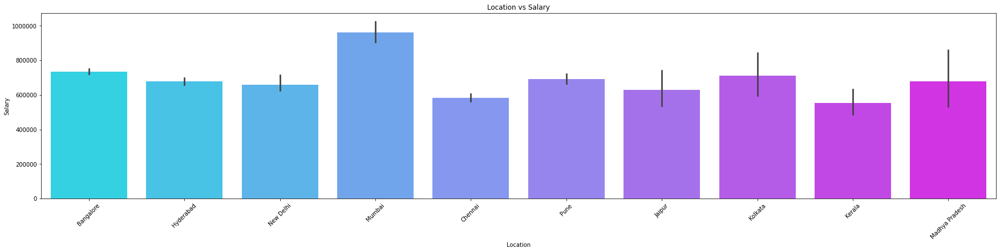

In [21]:
plt.figure(figsize = (30, 6))
plt.xticks(rotation = 45)
plt.ticklabel_format(style = 'Plain')
df.sort_values("Salary", axis = 0, ascending = True, inplace = True)
sns.barplot(x=df["Location"],y=df["Salary"],palette="cool").set(title='Location vs Salary');

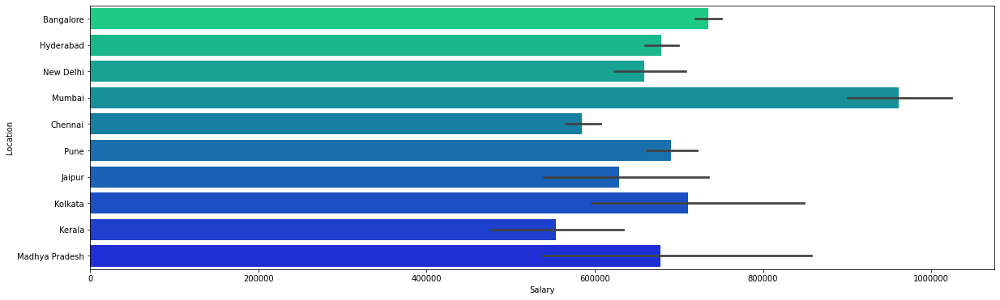

In [22]:
plt.figure(figsize = (20, 6))
plt.ticklabel_format(style = 'plain')
sns.barplot(x = df["Salary"], y = df["Location"], palette = "winter_r");



As we can see, employees living in expensive cities tend to get highest salaries among the rest.


Does some job role pay the higher salary?

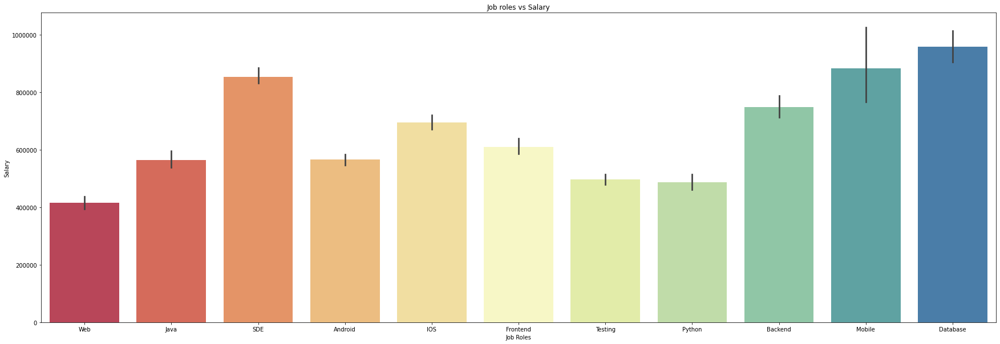

In [23]:
plt.figure(figsize=(30, 10))
plt.ticklabel_format(style='plain')
sns.barplot(x=df["Job Roles"],y=df["Salary"],palette="Spectral").set(title='Job roles vs Salary');


This shows that Database related roles and jobs play the highest salary among the others.


Does having a certain job title can get you higher salary?

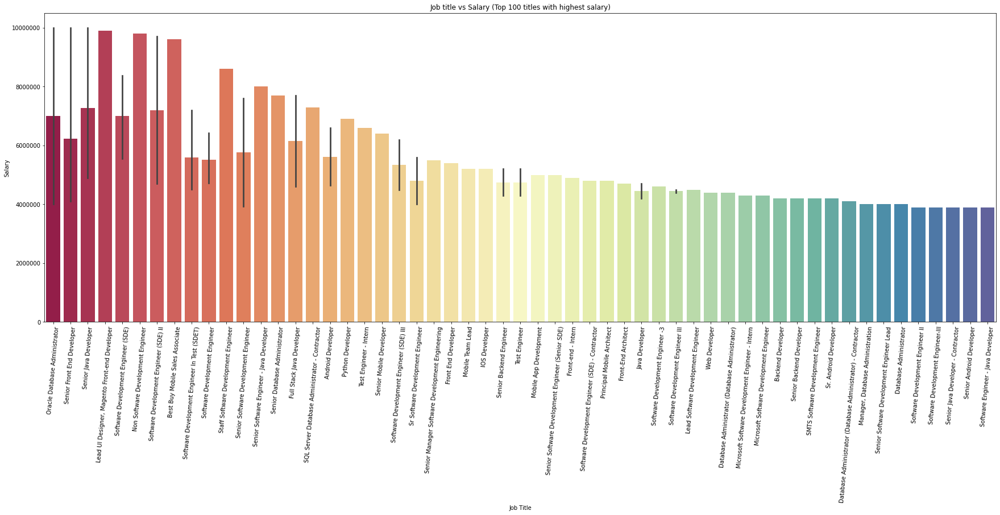

In [24]:
plt.figure(figsize = (30,10))
plt.xticks(rotation = 85)
plt.ticklabel_format(style = 'Plain')
df.sort_values("Salary",axis=0,ascending=False,inplace=True)
sns.barplot(x=df["Job Title"][1:100], y = df["Salary"] ,orient="v", palette = "Spectral").set(title='Job title vs Salary (Top 100 titles with highest salary)');

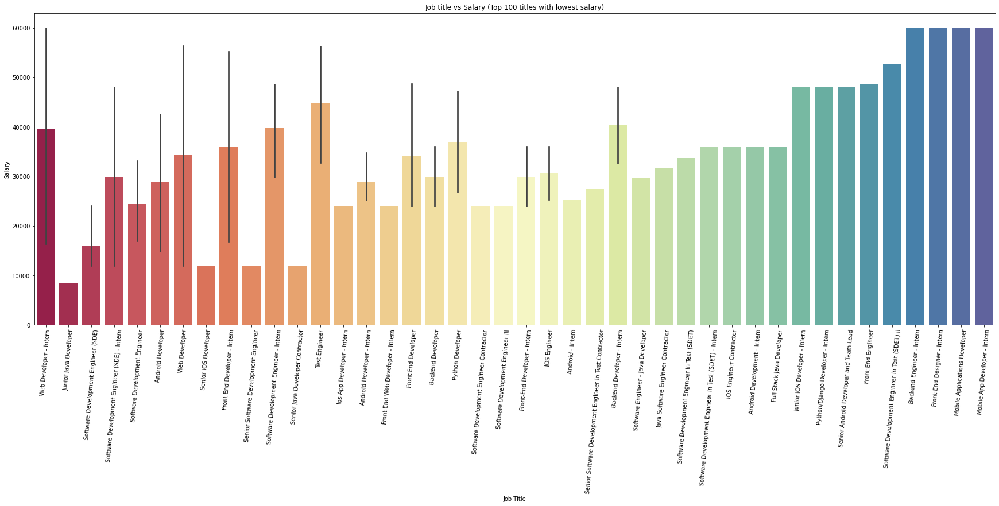

In [25]:
plt.figure(figsize = (30,10))
plt.xticks(rotation = 85)
plt.ticklabel_format(style = 'Plain')
df.sort_values("Salary", axis = 0, ascending = True, inplace = True)
sns.barplot(x = df["Job Title"][0:100], y = df["Salary"] ,orient="v", palette = "Spectral").set(title='Job title vs Salary (Top 100 titles with lowest salary)');

How salary differs based on Job title and how location and rating have a weight on them?

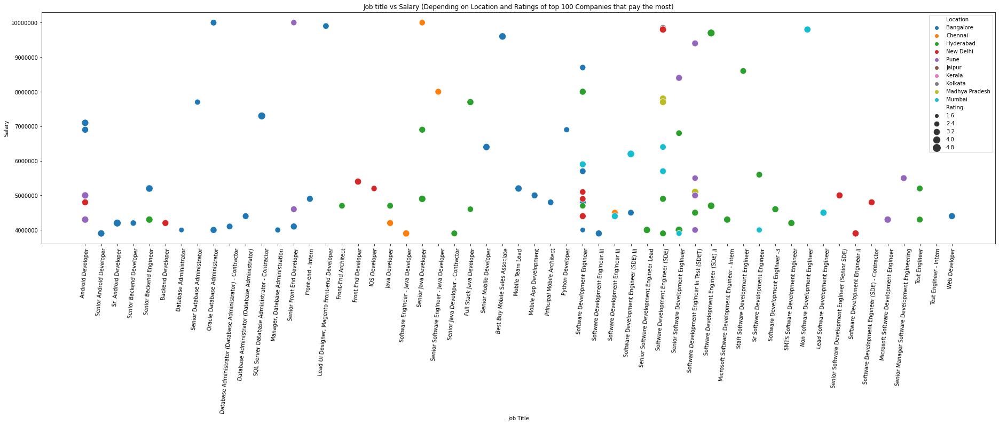

In [26]:
plt.figure(figsize = (32,8))
plt.xticks(rotation = 85)
plt.ticklabel_format(style = 'Plain')
df.sort_values("Salary", axis = 0, ascending = False, inplace = True)
sns.scatterplot(data=df, x=df["Job Title"][1:100], y=df["Salary"][:100],hue="Location", size='Rating', sizes=(10,200)).set(title='Job title vs Salary (Depending on Location and Ratings of top 100 Companies that pay the most)');
plt.legend(loc = "best")
plt.show()

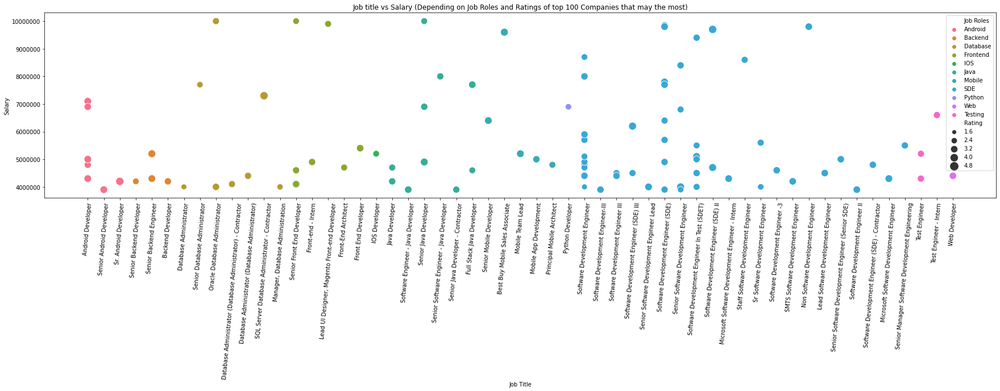

In [27]:
plt.figure(figsize = (30,6))
plt.xticks(rotation = 85)
plt.ticklabel_format(style = 'Plain')
df.sort_values("Salary", axis = 0, ascending = False, inplace = True)
sns.scatterplot(data=df, x=df["Job Title"][1:100], y=df["Salary"],hue="Job Roles", size='Rating', sizes=(10,200)).set(title='Job title vs Salary (Depending on Job Roles and Ratings of top 100 Companies that may the most)');
plt.legend(loc = "best")

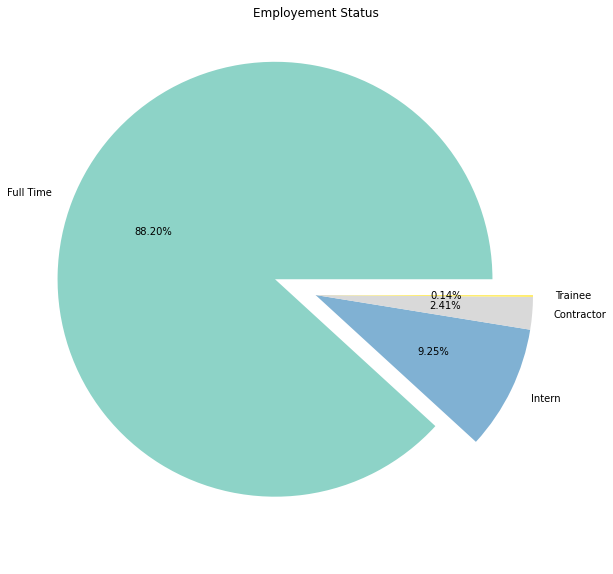

In [28]:
explode=(0.2,0,0,0)
df.sort_values("Salary", axis = 0, ascending = False, inplace = True)
df["Employment Status"].value_counts().plot.pie(figsize=(10,10),explode=explode,autopct='%0.2f%%',colormap="Set3",title="Employement Status");
ax = plt.gca()
ax.axes.yaxis.set_visible(False)

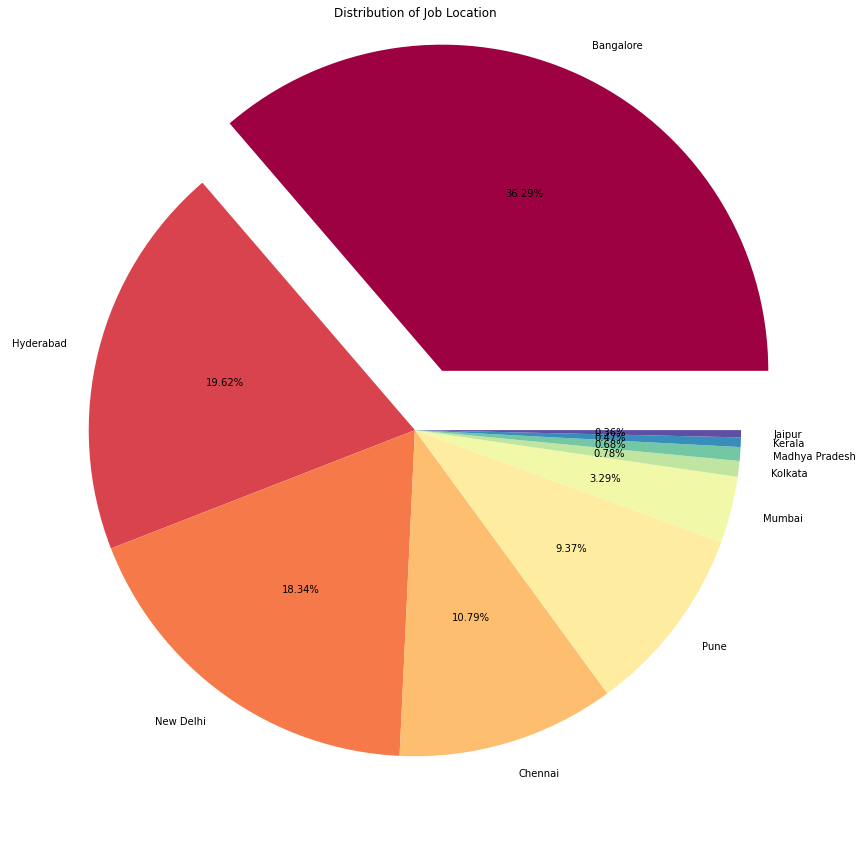

In [29]:
explode = (0.2, 0, 0, 0, 0, 0, 0, 0, 0, 0)
df["Location"].value_counts().plot.pie(figsize = (20,15),explode=explode,autopct='%0.2f%%',colormap="Spectral",title='Distribution of Job Location');
ax = plt.gca()
ax.axes.yaxis.set_visible(False)

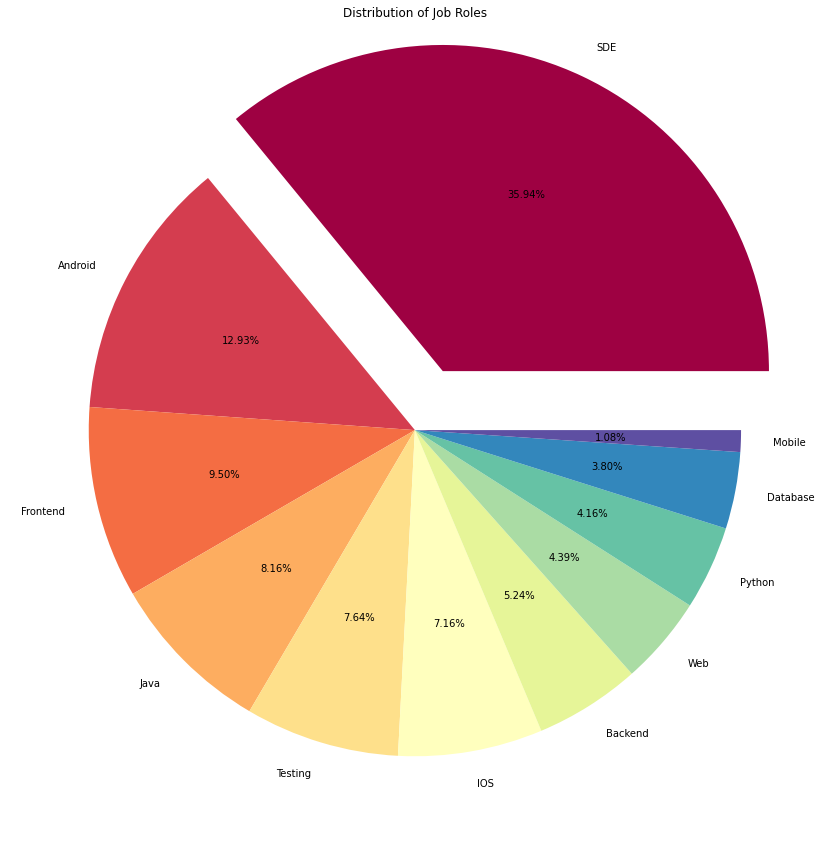

In [30]:
explode = (0.2,0,0,0,0,0,0,0,0,0,0)
df["Job Roles"].value_counts().plot.pie(figsize=(20,15),explode=explode,autopct='%0.2f%%',colormap="Spectral",title="Distribution of Job Roles");
ax = plt.gca()
ax.axes.yaxis.set_visible(False)

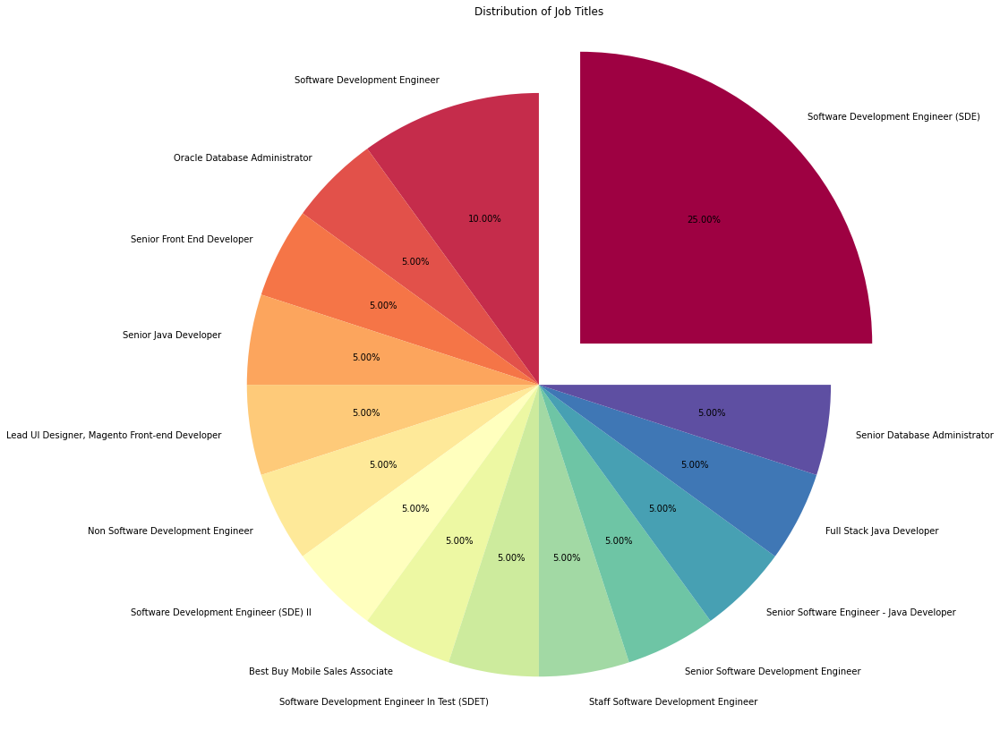

In [31]:
explode=(0.2,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
df.sort_values("Salary", axis = 0, ascending = False, inplace = True)
df["Job Title"][:20].value_counts().plot.pie(figsize=(20,15),explode=explode,autopct='%0.2f%%',colormap="Spectral",title="Distribution of Job Titles");
ax = plt.gca()
ax.axes.yaxis.set_visible(False)

In [32]:
highest_salary_job = df.nlargest(5,['Salary'])
highest_salary_job

,Rating,Company Name,Job Title,Salary,Salaries Reported,Location,Employment Status,Job Roles
18635,3.6,Thapar University,Software Development Engineer (SDE),90000000,1,New Delhi,Full Time,SDE
4471,3.8,Concentrix,Oracle Database Administrator,10000000,1,Bangalore,Full Time,Database
7121,3.5,Koru UX Design,Senior Front End Developer,10000000,1,Pune,Full Time,Frontend
9260,3.6,OASYS Cybernetics,Senior Java Developer,10000000,1,Chennai,Full Time,Java
5819,3.7,Nityo Infotech,"Lead UI Designer, Magento Front-end Developer",9900000,1,Bangalore,Full Time,Frontend


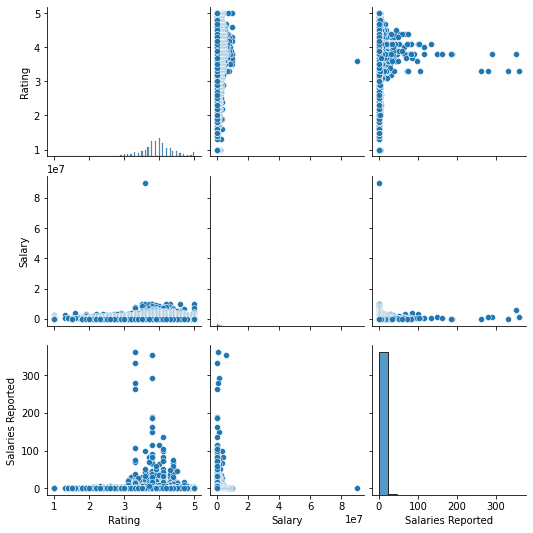

In [33]:
sns.pairplot(df)

This Graph shows the frequency of the Job Roles.

In [34]:
# Graph(1)
df1 = px.histogram(df, x='Job Roles', color='Job Roles', title="The Frequency of job role")
df1.update_layout(xaxis={'categoryorder' : 'total descending'})
df1.show()

This Graph shows the frequency of the Employment
Status.

In [35]:
# Graph(2)
df2 = px.histogram(df, x='Employment Status', color='Employment Status', title="the Frequency of Employment Status")
df2.update_layout(xaxis={'categoryorder' : 'total descending'})
df2.show()

This Graph indicates the salaries for every 'job role' and
the distribution by location:

We can easily control the graph to check the data properly. We can notice the sum of salaries in job role 'SDE'
(Software Development Engineer) is the highest one. We can notice there are different salaries according to
location

In [36]:
de_df = px.histogram(data_frame=df, x='Location', y='Salary', width=1000, height=700)
de_df.update_layout(xaxis={'categoryorder' : 'total descending'})
de_df.show()

In [37]:
# Graph(8, 10)
web_df = px.histogram(data_frame=df, x='Location', y='Salary', width=1000, height=700)
web_df.update_layout(xaxis={'categoryorder' : 'total descending'})
web_df.show()

# Correlation

In [38]:
x = df.drop('Salary',axis=1) #Feature Matrix
y = df['Salary']

In [39]:
# Separate database into train and test
from sklearn.model_selection import train_test_split
X_train,y_train,X_test,y_test = train_test_split(x,y,test_size = 0.3,random_state=0)
X_train.shape, X_test.shape

((15939, 7), (15939,))

In [40]:
X_train.corr()

,Rating,Salaries Reported
Rating,1.000000,-0.013644
Salaries Reported,-0.013644,1.000000


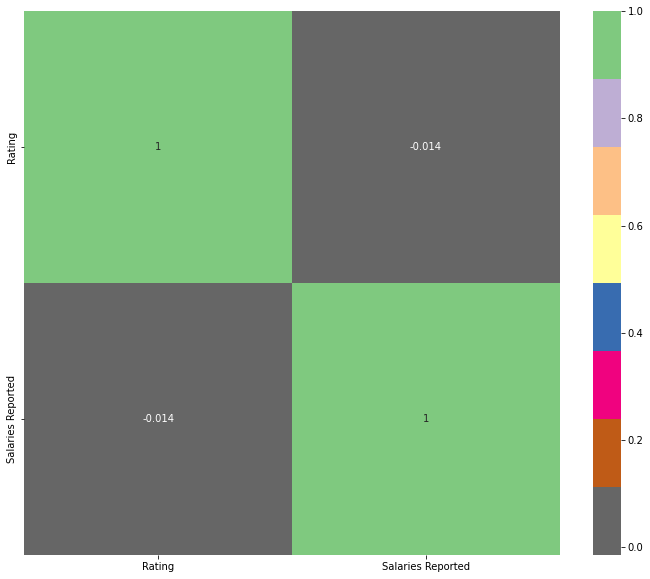

In [41]:
plt.figure(figsize=(12,10))
cor = X_train.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Accent_r)
plt.show()

Conclusion
1. SDE is the highest 'Job Role'
2. Software Development Engineer is the highest 'Job Title'
3. 'Bangalore' has the highest rate in Information Technology
4. There are big differences in salaries between cities for the same job role and same job title(We didn't see
   any data about the expertise of work, But we can put it into our consideration to understand these big
   differences in salaries
5. 'Full time' is the highest employeement status
6. Instead maximum people work as SDE but they can't pay much by companies. We can see Database job
   role payed more rather than other job roles.
7. There is no no correlation in this dataset(pearson coefficient=0)